In [2]:
from Bio import Phylo
from Bio import SeqIO
from augur.utils import json_to_tree
from augur.utils import json_to_tree
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np
import pandas as pd
import requests
import json
import Bio.Phylo as Phylo
from Bio.Phylo.BaseTree import Clade

In [6]:
#path to tree json
tree_file = '../auspice_033023/ncov_gisaid_adaptive-evolution-2023-03-30.json'

with open(tree_file, 'r') as f:
    tree_json = json.load(f)

#put tree in Bio.phylo format
tree = json_to_tree(tree_json)

In [7]:
#number of terminal nodes
print(len(tree.get_terminals()))

7845


In [8]:
#number of internal nodes
print(len(tree.get_nonterminals()))

6868


In [ ]:
#total nodes = 14663

In [ ]:
# count the number of terminal tips and internal nodes
num_internal = tree.count_nonterminals()

# print the results
print("Number of terminal tips:", num_terminals)
print("Number of internal nodes:", num_internal)

In [3]:
count = 0
for node in tree.find_clades(terminal = True): #terminal = True is only tips 
    #print(node.name)
    #print(node.branch_attrs["mutations"])
    #print(tree.get_path(node)) #list of nodes
    #print("\n") #adds space between each node
    count=count + 1
    if count >= 10:
        break

In [9]:
genes_of_interest = ["ORF1a", "ORF1b", "S", "ORF3a", "E", "M", "ORF6", "ORF7a", "ORF7b", "ORF8", "N", "ORF9b"]

In [13]:
# create a dictionary for each gene of interest to store mutation counts for each tip and internal node
mutation_counts_by_gene = {}

count = 0
# loop through each tip and internal node and count mutations
for node in tree.find_clades(): #loops through each tip and internal node in the tree
    """
    You'll need to put a different tip name here. Your tree isn't in the repo, so I'm using one of mine
    """
    if node.name == 'Slovenia/171301/2022':
        
        path = tree.get_path(node)#gets path from the root of the tree to the current node
        #print(len(path))
        path_mutations = {} #creates an empty dictionary to store the mutations along path for each gene
        for gene in genes_of_interest:
            path_mutations[gene] = [] # create an empty dictonary for each gene to store the mutations along the path
        #print(path_mutations)
        #break
        for i in range(len(path) - 1): #loops through each branch along the path, except for the last one (which leads to the current node)
            mutations = path[i].branch_attrs['mutations']
            #print(len(mutations))
            for k,v in mutations.items(): #k= key, v=value 
                #print(k,v)
                if k in genes_of_interest:
                    """
                    You can print here to see which nodes you are looping over that have mutations (path[i])
                    and which mutations they have (v) and in which gene (k)
                    """
                    print(path[i])
                    print(k, v)
                    
                    
                    path_mutations[k]+= v #at this point, I am still getting list of mutations at each node.
        """
        Or you can print here to all of the mutations that have occurred along the path from root to tip
        in dictionary form, with gene:[list of all mutations on path]
        """
        print(path_mutations) 
        
    """
    Now you have all the mutations for along the path to this node, which is what we want
    You just need to find how many mutations there are in each gene
    And then add the information for this node to a dictionary or list or somewhere where 
    you will keep track of this information for all of the nodes
    """
                
            
            
            
            
            
            
            
            
            #print(len(path_mutations[k]+= v))
                #value_count = len(v)
                #mutation_counts_by_gene.append(len(path_mutations[v]))
            #print(path_mutations)        
    #for gene, mutations in path_mutations.items():
    #    if gene not in mutation_counts_by_gene:
    #        mutation_counts_by_gene[gene] = []
    #    mutation_counts_by_gene[gene].append(len(mutations))
    #print(mutation_counts_by_gene)
    
    
    
    #for gene in genes_of_interest:
    #    num_mutations = len(path_mutations[gene])    
    #num_mutations = len(path_mutations[gene])
    #print(f"Number of mutations for {gene}: {num_mutations}")
                        #mutation_counts_by_gene[k] += 1
                #num_mut = len(path_mutations[k])
                #mutation_counts_by_gene[k] += num_mutations

            #len of the list for each gene in the dictonary 
                #if mutation.split(":")[0] == gene:
    #path_mutations dict make outside of for loop, initialize dictonary to store information for each node 
    
        #mutations = path[i].branch_attrs("mutations", {}) #gets the mutations along the current branch
        #print(mutations)
        #break
        #for mutation in mutations:
        #    if gene in genes_of_interest:
        #       if mutation.split(":")[0] == gene:
        #          path_mutations[gene].update({path[i].name: [mutation]}) #increment the count of the mutation if it already exists in the dictionary
    #print(mutations) 
    
    #count mutations for each gene along the path
    #for gene in genes_of_interest:
    #    mutation_counts_by_gene[gene] = {}
    #    mutation_count = len(path_mutations[gene]) #count the number of mutations for the current gene along the path
    #    #print(mutation_count)
    #    #store mutation count for tip in dictionary
    #    mutation_counts_by_gene[gene][node.name] = mutation_count


NODE_0001189
ORF1b ['P314L']
NODE_0001186
S ['D614G']
NODE_0004596
N ['R203K', 'G204R']
NODE_0006876
N ['P13L']
NODE_0006878
ORF1a ['T3255I', 'P3395H', 'S3675-', 'G3676-']
NODE_0006878
ORF1b ['I1566V']
NODE_0006878
S ['G142D', 'G339D', 'S371L', 'S373P', 'S375F', 'K417N', 'N440K', 'S477N', 'T478K', 'E484A', 'Q493R', 'Q498R', 'N501Y', 'Y505H', 'H655Y', 'N679K', 'P681H', 'N764K', 'D796Y', 'Q954H', 'N969K']
NODE_0006878
M ['Q19E', 'A63T']
NODE_0006878
N ['E31-', 'R32-', 'S33-']
NODE_0007090
ORF1a ['S2083-', 'L2084I', 'A2710T', 'L3674-', 'I3758V']
NODE_0007090
S ['A67V', 'H69-', 'V70-', 'T95I', 'R346K', 'G446S', 'N856K', 'L981F']
NODE_0007090
M ['D3G']
NODE_0007091
S ['D142-', 'G496S', 'T547K']
NODE_0007092
ORF1a ['K856R']
NODE_0007092
S ['V143-', 'Y144-', 'Y145D', 'N211-', 'L212I']
NODE_0007147
S ['K346R']
NODE_0007463
S ['R346K']


In [40]:
mutation_counts_by_gene = {}
count = 0
total_nodes = 0
for node in tree.find_clades():
    total_nodes += 1
    path = tree.get_path(node)
    ...
    
print("Total number of nodes:", total_nodes)
print("Number of tips:", tree.count_terminals())

Total number of nodes: 14663
Number of tips: 8162


In [6]:
count = 0
for key, value in mutation_counts_by_gene.items():
    if count >= 10:
        break
    print(key, value)
    count += 1

In [7]:
print(len(mutation_counts_by_gene['S'])) #right now I am getting mutation counts for all nodes. 
#not just along the path to terminal nodes

14663


In [ ]:
#print(mutation_counts_by_gene)

In [8]:
# create a dictionary that counts the frequency of each number in the list
mutation_count_dict = {}
for count in mutation_counts_by_gene['gene_of_interest']:
    if count not in mutation_count_dict:
        mutation_count_dict[count] = 0
    mutation_count_dict[count] += 1

# create a bar graph of the counts
plt.bar(mutation_count_dict.keys(), mutation_count_dict.values())

# set the x and y labels and title
plt.xlabel('Number of Mutations')
plt.ylabel('Frequency')
plt.title('Frequency of Mutations for Gene of Interest')

# show the plot
plt.show()


KeyError: 'gene_of_interest'

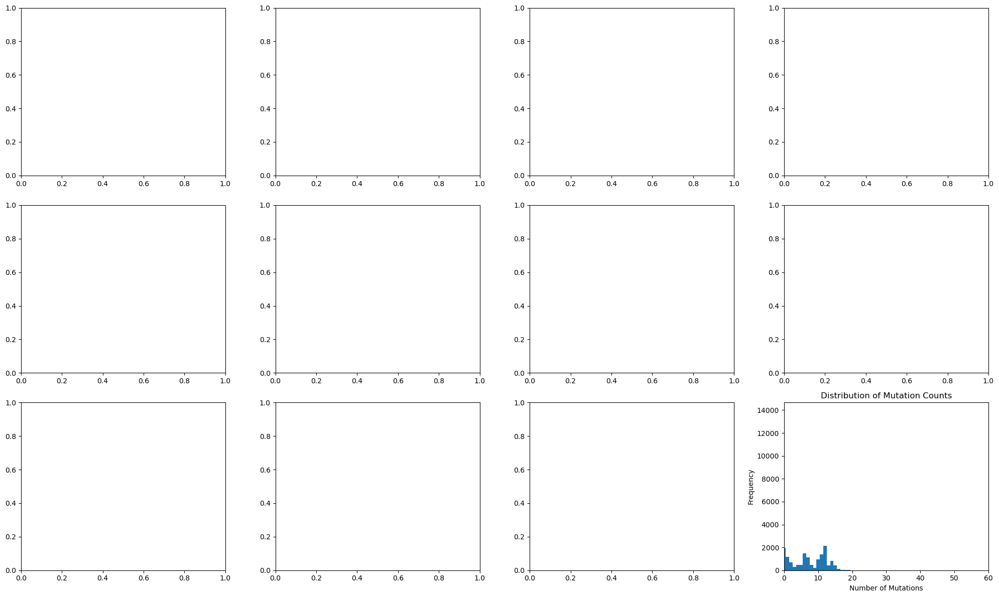

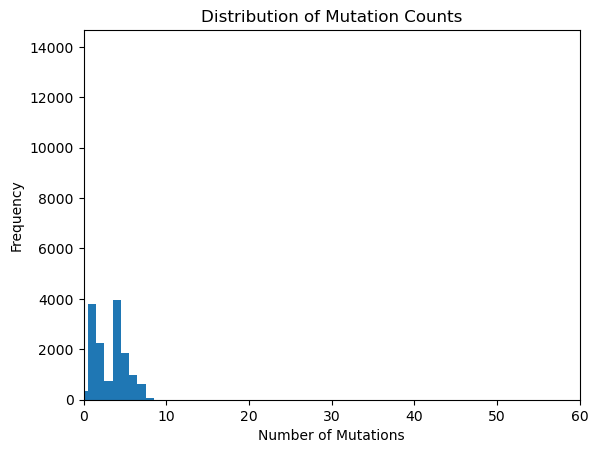

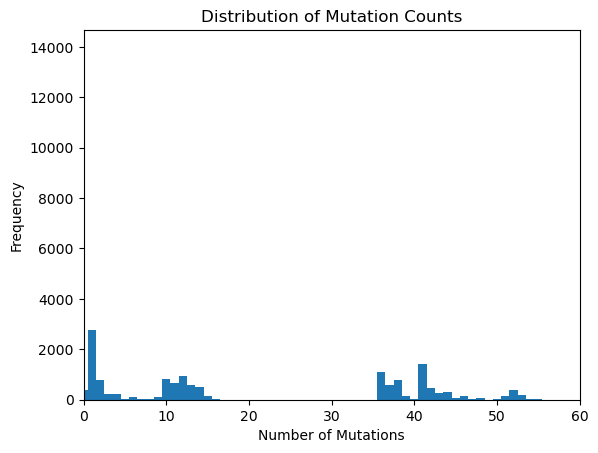

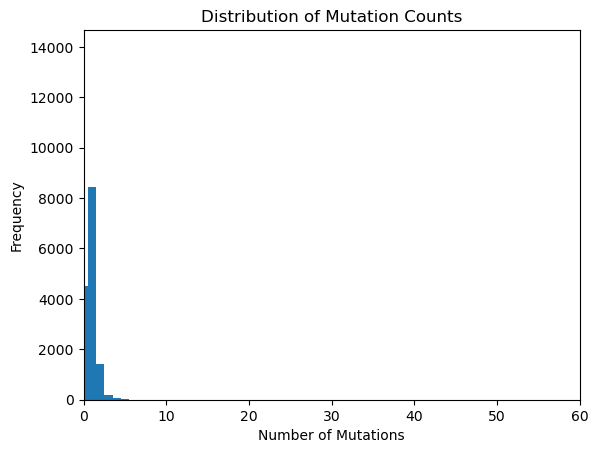

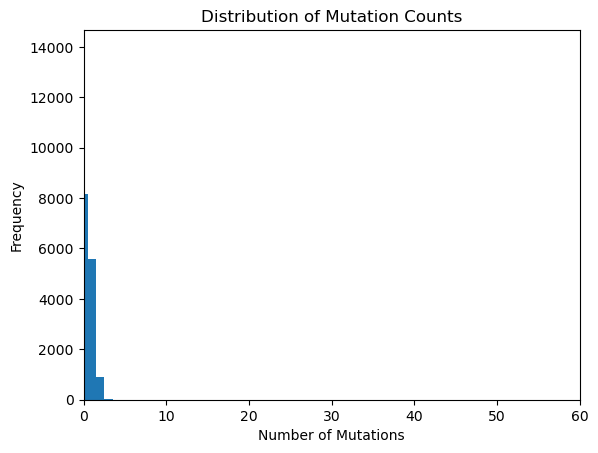

...

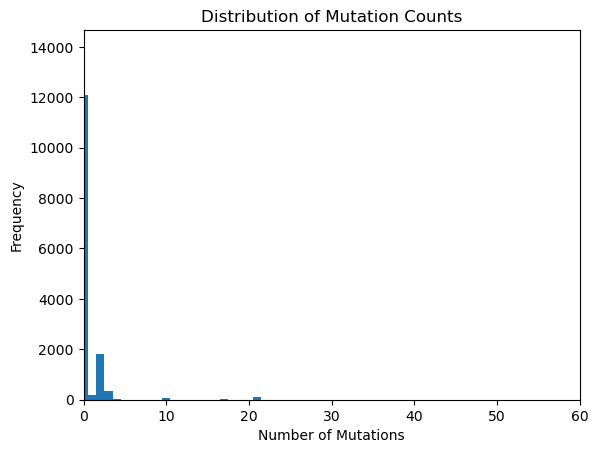

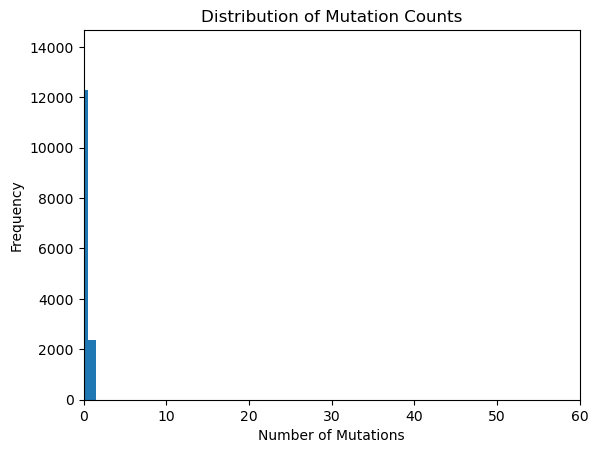

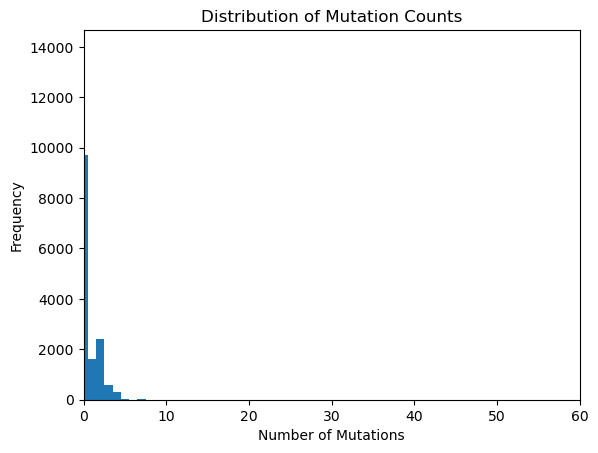

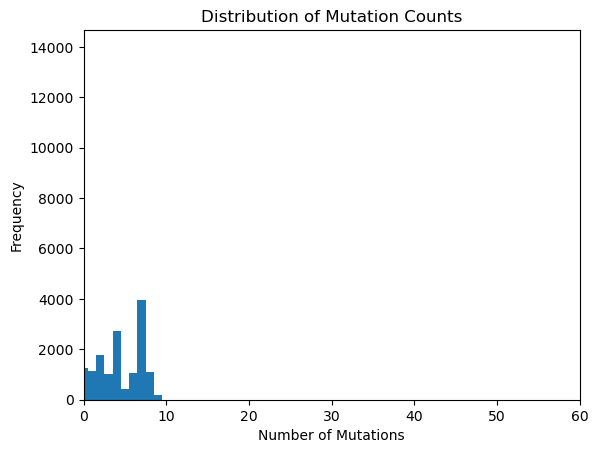

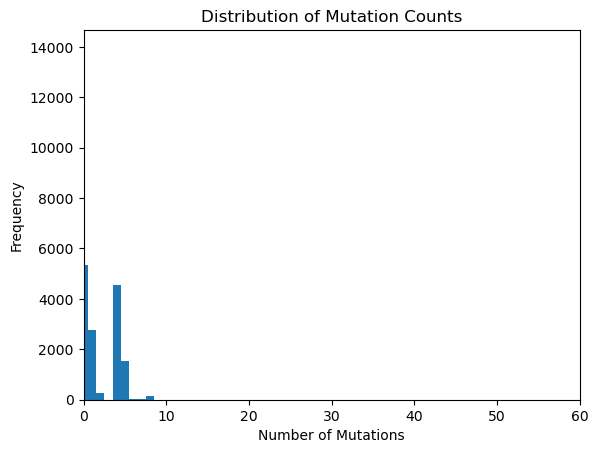

In [12]:
# create subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12))
axes = axes.flatten()

# loop through each gene and plot the frequency of mutations
#for i, gene in enumerate(genes_of_interest): #enumerate numbers each item in a list
#    # get the mutation counts for the gene
#    counts = list(mutation_counts_by_gene[gene].values())
#    # plot histogram
#    sns.histplot(ax=axes[i], data=counts, bins=range(30), color='royalblue')
#    axes[i].set_title(gene)
#   axes[i].set_xlabel("Number of Mutations")
#    axes[i].set_ylabel("Frequency")

# adjust spacing and show plot
# set the title
#plt.title("Distribution of Mutation Counts")
#plt.show()

# loop through each gene and create a histogram of the mutation counts
for gene, counts in mutation_counts_by_gene.items():
    sns.histplot(ax=axes[i], data=counts, bins=range(30), color='royalblue')
    #plt.hist(counts, bins=range(61), align='left')
    plt.xlim(0, 60)
    plt.ylim(0, len(counts))
    plt.xlabel('Number of Mutations')
    plt.ylabel('Frequency')
    plt.title("Distribution of Mutation Counts")
    fig.tight_layout()
    plt.show()


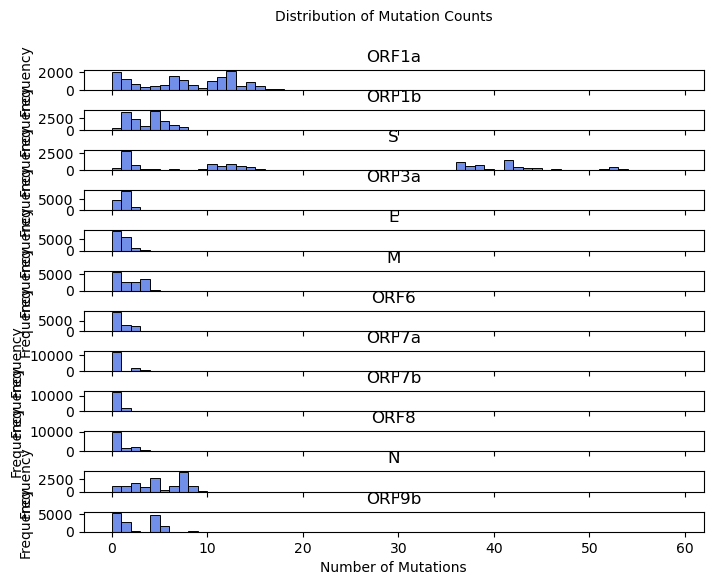

In [20]:
import seaborn as sns
# create a figure with subplots for each gene
#fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12))
fig, axes = plt.subplots(len(genes_of_interest), 1, figsize=(8, 6), sharex=True)

#fig, axes = plt.subplots(nrows=3, ncols=4, len(genes_of_interest), figsize=(8, 6))

# loop through each gene and plot the histogram of mutation counts
for i, gene in enumerate(genes_of_interest):
    # get the mutation counts for the gene
    counts = mutation_counts_by_gene[gene]
    # plot histogram
    sns.histplot(ax=axes[i], data=counts, bins=range(60), color='royalblue')
    axes[i].set_title(gene)
    axes[i].set_xlabel("Number of Mutations")
    axes[i].set_ylabel("Frequency")

# adjust spacing and show plot
plt.subplots_adjust(hspace=1)
plt.suptitle("Distribution of Mutation Counts", fontsize=10)
plt.show()


In [59]:
for node in tree.find_clades(order='preorder'):
    if isinstance(node, Clade):
        mutations = node.branch_attrs['mutations']
        print("Node:", node.name)
        print("Mutations:", mutations)
        print("Branch length:", node.branch_length)

Node: NODE_0000006
Mutations: {}
Branch length: 0.0
Node: hCoV-19/Wuhan/Hu-1/2019
Mutations: {}
Branch length: 0
Node: NODE_0000001
Mutations: {}
Branch length: 0
Node: NODE_0000007
Mutations: {}
Branch length: 0
Node: NODE_0000397
Mutations: {'nuc': ['C15324T', 'C29303T'], 'N': ['P344S']}
Branch length: 2
Node: hCoV-19/UnitedArabEmirates/skmc-003/2020
Mutations: {'nuc': ['C10456T', 'T21644C', 'C23170T'], 'S': ['Y28H']}
Branch length: 3
Node: hCoV-19/Japan/KP1/2020
Mutations: {'nuc': ['G11557T', 'C25810G'], 'ORF1a': ['E3764D'], 'ORF3a': ['L140V']}
Branch length: 2
Node: NODE_0000016
Mutations: {}
Branch length: 0
Node: hCoV-19/Wuhan/HBCDC-HB-01/2019
Mutations: {'nuc': ['T21656A'], 'S': ['F32I']}
Branch length: 1
Node: NODE_0000020
Mutations: {}
Branch length: 0
Node: NODE_0000391
Mutations: {'nuc': ['C3037T']}
Branch length: 1
Node: hCoV-19/India/OR-ILSCV19358/2020
Mutations: {'nuc': ['T3913C', 'T6163C', 'C9559T', 'C10641T', 'C21691T', 'A25381C', 'C26542A'], 'ORF1a': ['T3459M'], 'M': [

Branch length: 2
Node: NODE_0004791
Mutations: {}
Branch length: 0
Node: hCoV-19/India/GJ-INSACOG-GBRC6143/2022
Mutations: {'nuc': ['A10323G', 'C27686T'], 'ORF1a': ['K3353R'], 'ORF7a': ['S98F']}
Branch length: 2
Node: NODE_0004793
Mutations: {}
Branch length: 0
Node: NODE_0005614
Mutations: {'nuc': ['T21765C'], 'S': ['I68T']}
Branch length: 1
Node: hCoV-19/Bangladesh/IEDCR-GSB01-338/2022
Mutations: {'nuc': ['C44T', 'T474C', 'C1185T', 'G5629T', 'C5812T', 'C22088T', 'C26028T'], 'ORF1a': ['F70S', 'A307V'], 'S': ['L176F']}
Branch length: 6
Node: hCoV-19/Netherlands/FR-RIVM-101189/2022
Mutations: {'nuc': ['C5175T', 'C14425A', 'C21077T'], 'ORF1a': ['T1637I'], 'ORF1b': ['L320I', 'T2537I']}
Branch length: 3
Node: NODE_0005434
Mutations: {}
Branch length: 0
Node: hCoV-19/NewZealand/22CV4260/2022
Mutations: {'nuc': ['G510-', 'T511-', 'C512-', 'A513-', 'T514-', 'G515-', 'T516-', 'T517-', 'A518-', 'C14235T', 'T17865C', 'C23896A', 'C27434T', 'T28963C', 'C29200T'], 'ORF1a': ['G82-', 'H83-', 'V84-', 

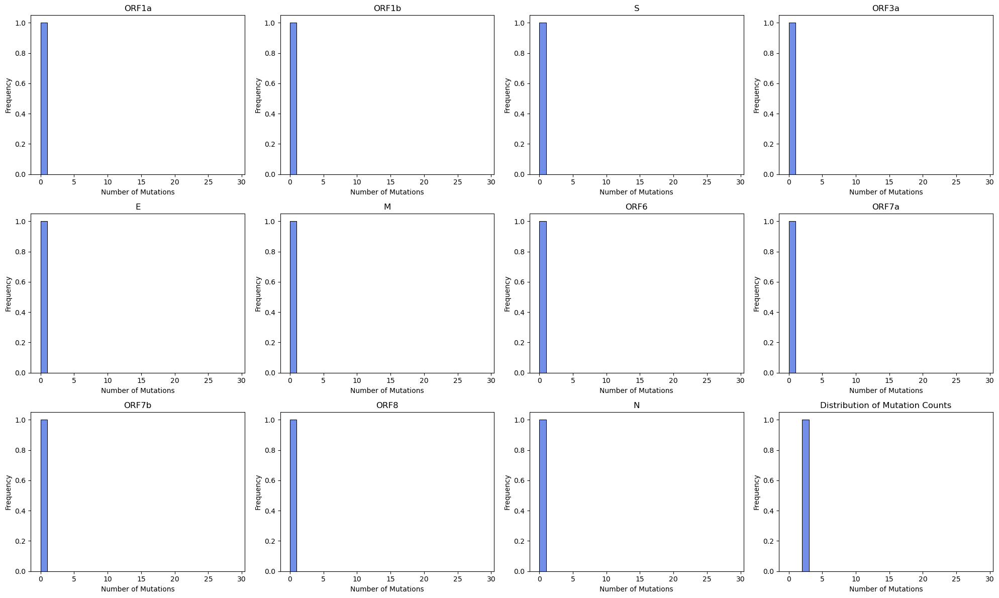

In [60]:
# create subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12))
axes = axes.flatten()

# loop through each gene and plot the frequency of mutations
for i, gene in enumerate(genes_of_interest): #enumerate numbers each item in a list
    # get the mutation counts for the gene
    counts = list(mutation_counts_by_gene[gene].values())
    # plot histogram
    sns.histplot(ax=axes[i], data=counts, bins=range(30), color='royalblue')
    axes[i].set_title(gene)
    axes[i].set_xlabel("Number of Mutations")
    axes[i].set_ylabel("Frequency")

# adjust spacing and show plot
# set the title
plt.title("Distribution of Mutation Counts")
fig.tight_layout()
plt.show()

In [32]:
for node in tree.find_clades(order='preorder'):
    if isinstance(node, Clade):
        mutations = node.branch_attrs['mutations']
        print("Node:", node.name)
        print("Mutations:", mutations)
        print("Branch length:", node.branch_length)

Node: NODE_0000006
Mutations: {}
Branch length: 0.0
Node: hCoV-19/Wuhan/Hu-1/2019
Mutations: {}
Branch length: 0
Node: NODE_0000001
Mutations: {}
Branch length: 0
Node: NODE_0000007
Mutations: {}
Branch length: 0
Node: NODE_0000397
Mutations: {'nuc': ['C15324T', 'C29303T'], 'N': ['P344S']}
Branch length: 2
Node: hCoV-19/UnitedArabEmirates/skmc-003/2020
Mutations: {'nuc': ['C10456T', 'T21644C', 'C23170T'], 'S': ['Y28H']}
Branch length: 3
Node: hCoV-19/Japan/KP1/2020
Mutations: {'nuc': ['G11557T', 'C25810G'], 'ORF1a': ['E3764D'], 'ORF3a': ['L140V']}
Branch length: 2
Node: NODE_0000016
Mutations: {}
Branch length: 0
Node: hCoV-19/Wuhan/HBCDC-HB-01/2019
Mutations: {'nuc': ['T21656A'], 'S': ['F32I']}
Branch length: 1
Node: NODE_0000020
Mutations: {}
Branch length: 0
Node: NODE_0000391
Mutations: {'nuc': ['C3037T']}
Branch length: 1
Node: hCoV-19/India/OR-ILSCV19358/2020
Mutations: {'nuc': ['T3913C', 'T6163C', 'C9559T', 'C10641T', 'C21691T', 'A25381C', 'C26542A'], 'ORF1a': ['T3459M'], 'M': [

Node: NODE_0003408
Mutations: {}
Branch length: 0
Node: hCoV-19/USA/OH-CDC-ASC210031260/2021
Mutations: {'nuc': ['A10323G', 'G15732T', 'A17187G'], 'ORF1a': ['K3353R']}
Branch length: 3
Node: NODE_0003411
Mutations: {}
Branch length: 0
Node: hCoV-19/Bonaire/BQ-RIVM-35152/2021
Mutations: {'nuc': ['G1957A', 'C4752T', 'C18928T', 'G29000T'], 'ORF1a': ['T1496I'], 'ORF1b': ['P1821S'], 'N': ['G243C']}
Branch length: 4
Node: NODE_0003413
Mutations: {}
Branch length: 0
Node: NODE_0003186
Mutations: {'nuc': ['C26110T'], 'ORF3a': ['P240S']}
Branch length: 1
Node: hCoV-19/USA/NH-CDCBI-CRSP_BFSIJMT5CIMSP2J7/2021
Mutations: {'nuc': ['T4152C'], 'ORF1a': ['L1296S']}
Branch length: 1
Node: NODE_0003187
Mutations: {'nuc': ['C673T', 'C18747T', 'G20683A', 'C20844T', 'C29095T'], 'ORF1b': ['V2406I']}
Branch length: 5
Node: hCoV-19/Mexico/COL-IBT_IMSS_1868/2021
Mutations: {'nuc': ['C11514T', 'C12896T'], 'ORF1a': ['T3750I', 'P4211S']}
Branch length: 2
Node: hCoV-19/Mexico/COL-LANGEBIO_IMSS_1266/2021
Mutations:

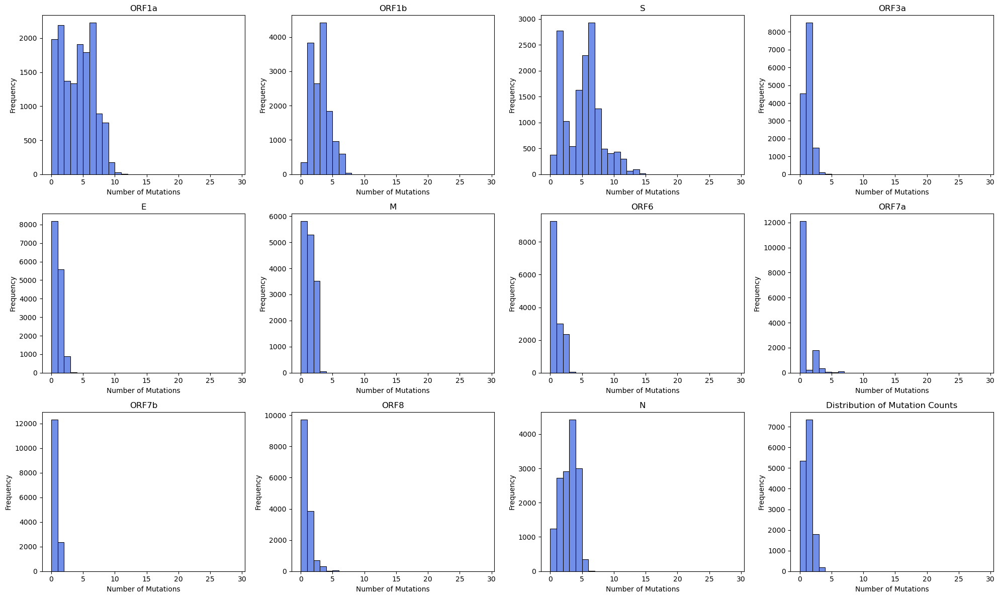

In [30]:
# create subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12))
axes = axes.flatten()

# loop through each gene and plot the frequency of mutations
for i, gene in enumerate(genes_of_interest): #enumerate numbers each item in a list
    # get the mutation counts for the gene
    counts = list(mutation_counts_by_gene[gene].values())
    # plot histogram
    sns.histplot(ax=axes[i], data=counts, bins=range(30), color='royalblue')
    axes[i].set_title(gene)
    axes[i].set_xlabel("Number of Mutations")
    axes[i].set_ylabel("Frequency")

# adjust spacing and show plot
# set the title
plt.title("Distribution of Mutation Counts")
fig.tight_layout()
plt.show()

In [39]:
mutation_counts_by_gene = {}
for gene in genes_of_interest:
    mutation_counts_by_gene[gene] = {} 

# loop through each tip and internal node and count mutations
for node in tree.find_clades(): #loops through each tip and internal node in the tree
    path = tree.get_path(node) #gets path from the root of the tree to the current node
    path_mutations = {} #creates an empty dictionary to store the mutations along path for each gene
    for gene in genes_of_interest:
        path_mutations[gene] = {} # create an empty dictionary for each gene to store the mutations along the path
        
    for i in range(len(path) - 1): #loops through each branch along the path, except for the last one (which leads to the current node)
        mutations = path[i].branch_attrs.get("mutations", []) #gets the mutations along the current branch
        for mutation in mutations:
            for gene in genes_of_interest:
                if mutation.split(":")[0] == gene: #checks if mutation is in current gene of interest
                    path_mutations[gene].update({path[i].name: [mutation]}) #adds the mutation to the dictionary for the current gene
        
    # add mutations at current node to path_mutations dictionary
    node_mutations = node.node_attrs.get("mutations", {})
    for gene in genes_of_interest:
        gene_mutations = []
        for mutation in node_mutations:
            if mutation.split(":")[0] == gene:
                gene_mutations.append(mutation)
        if gene_mutations:
            path_mutations[gene].update({node.name: gene_mutations})
        
    # count mutations for each gene along the path
    for gene in genes_of_interest:
        mutation_count = sum([len(path_mutations[gene][node_name]) for node_name in path_mutations[gene].keys()]) #count the number of mutations for the current gene along the path
        #store mutation count for tip in dictionary
        mutation_counts_by_gene[gene][node.name] = mutation_count


In [41]:
for gene in genes_of_interest:
    mutation_counts = [mutation_counts_by_gene[gene][tip] for tip in tree.get_terminals()] # get mutation counts for each tip
    plt.hist(mutation_counts, bins=range(0, max(mutation_counts)+2), align='left', rwidth=0.5) # create histogram
    plt.title(f"{gene} Mutation Counts")
    plt.xlabel("Number of Mutations")
    plt.ylabel("Frequency")
    plt.show()

KeyError: Clade(branch_length=0, cumulative_branch_length=0, name='hCoV-19/Wuhan/Hu-1/2019')

In [6]:
# creates a dictonary for each gene of interest and counts the number of mutations accumulated 
# throughout the path for each tree tip

genes_of_interest = ["ORF1a", "ORF1b", "S", "ORF3a", "E", "M", "ORF6", "ORF7a", "ORF7b", "ORF8", "N", "ORF9b"]

# create a dictionary for each gene of interest to store mutation counts for each tip
mutation_counts_by_gene = {}
for gene in genes_of_interest:
    mutation_counts_by_gene[gene] = {}

# loop through each tip and count mutations
for node in tree.find_clades(terminal=True): #loops through each terminal node in the tree

    path = tree.get_path(node) #gets path from the root of the tree to the current node
    path_mutations = [] #creates an empty list to store the mutations along path
    count+=1
    for i in range(len(path) - 1): #loops through each branch along the path, except for the last one (which leads to the current node)
        path_mutations += path[i].branch_attrs.get("mutations", []) #adds the mutations along the current branch to list    
        """
        Here you are just adding the keys of the mutations dictionary to `path_mutations`
        Try printing `path_mutations` to see this.
        Since you are looking at ALL genes at this stage, I think `path_mutations` would work better as a dictionary 
        rather than a list for the strategy you're going for here.
        After making `path_mutations` a dictionary, you will want to use the .update() function 
        to add mutations to `path_mutations` at each node you pass within this loop.
        After implementing this, you can try printing `branch_attrs['mutations']` and `path_mutations` within this loop 
        to convince yourself that the dictionary is updating whenever you loop over a node that has mutations
        """

    for gene in genes_of_interest: #loops through each gene of interest
        gene_mutation_count = 0 #initializes a count of the mutations for the current gene to zero

        for mutation in path_mutations: # loops through each mutation along the path
            """
            I don't think `mutation` here is what you are expecting it to be-
            try printing `mutation` to see what you are actually looping through here.
            If you choose to make `path_mutations` a dictionary as I suggested above, 
            you'll be able access to all of the mutations that occurred along path, for each gene. 
            Then, since you are looping through genes here, you can access all of the mutations 
            for `gene` from the dictionary
            """

            if mutation.split(":")[0] == gene: #checks if mutation is in current gene of interest
                gene_mutation_count += 1 #adds the mutation count +1 if mutation is in gene
                """
                +=1 will just add 1 for the list of mutations within `gene`. 
                You want to count how many mutations are in that list
                """
        # store mutation count for tip in dictionary
        mutation_counts_by_gene[gene][node.name] = gene_mutation_count   
        

In [12]:
# create a dictionary for each gene of interest to store mutation counts for each tip
mutation_counts_by_gene = {}
for gene in genes_of_interest:
    mutation_counts_by_gene[gene] = {}     
        
# loop through each tip and count mutations
for node in tree.find_clades(terminal=True): #loops through each terminal node in the tree
    path = tree.get_path(node) #gets path from the root of the tree to the current node
    path_mutations = {} #creates an empty dictionary to store the mutations along path for each gene
    for gene in genes_of_interest:
        path_mutations[gene] = [] # create an empty list for each gene to store the mutations along the path
        
    for i in range(len(path) - 1): #loops through each branch along the path, except for the last one (which leads to the current node)
        mutations = path[i].branch_attrs.get("mutations", [])#gets the mutations along the current branch
        #print(mutations)
        for mutation in mutations:
            for gene in genes_of_interest:
                if mutation.split(":")[0] == gene: #checks if mutation is in current gene of interest
                    path_mutations[gene].append(mutation) #adds the mutation to the list for the current gene
        
    # count mutations for each gene along the path
    for gene in genes_of_interest:
        mutation_count = len(path_mutations[gene]) #count the number of mutations for the current gene along the path
        #print(mutation_count)# store mutation count for tip in dictionary
        mutation_counts_by_gene[gene][node.name] = mutation_count

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
2
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
1
1
0
0
0
0
0
0
0
0
1
0
1
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
1
0
0
1
0
0
0
0


3
3
1
2
0
0
0
0
0
1
2
0
3
3
1
2
0
0
0
0
0
1
2
0
3
3
1
2
0
0
0
0
0
1
2
0
3
3
1
2
0
0
0
0
0
1
2
0
3
3
1
2
0
0
0
0
0
1
2
0
3
3
1
2
0
0
0
0
0
1
1
0
3
3
1
2
0
0
0
0
0
1
1
0
3
3
1
2
0
0
0
0
0
1
1
0
3
3
1
2
0
0
0
0
0
1
1
0
3
3
1
2
0
0
0
0
0
1
1
0
3
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
4
1
2
1
0
0
0
0
1
2
0
2
4
1
2
1
0
0
0
0
1
2
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
4
1
2
0
0
0
0
0
1
1
0
3
4
1
2
0
0
0
0
0
1
1
0
3
4
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
4
1
3
0
0
0
0
0
1
2
0
2
4
1
3
0
0
0
0
0
1
2
0
2
4
1
3
0
0
0
0
0
1
2
0
2
4
2
3
0
0
0
0
0
1
2
0
2
4
2
3
0
0
0
0
0
1
2
0
3
3
1
3
0
0
0
0
0
1
1
0
3
3
1
3
0
0
0
0
0
1
1
0
3
3
1
3
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0
0
1
1
0
2
3
1
2
0
0
0
0


1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
0
1
1
1
0
0
0
0
0
0
1
0
1
1
2
1
0
0
0
0
0
0
1
0
1
1
2
1
0
0
0
0
0
0
1
0
1
1
3
2
0
0
0
0
0
0
2
0
2
1
4
2
0
0
0
0
0
0
3
0
2
1
4
2
0
0
0
0
0
0
3
0
1
2
3
1
0
0
0
0
0
0
2
0
3
3
4
2
0
0
0
0
1
1
2
1
3
3
4
2
0
0
0
0
1
1
2
1
2
2
4
2
0
0
0
0
1
1
2
1
2
2
5
2
0
0
0
0
1
1
2
1
2
2
5
2
0
0
0
0
1
1
2
1
2
2
5
2
0
0
0
0
1
1
2
1
3
2
5
2
0
0
0
0
1
1
2
1
3
2
5
2
0
0
0
0
1
1
2
1
2
3
5
2
0
0
0
0
1
1
2
1
2
3
5
2
0
0
0
0
1
1
2
1
2
3
5
3
0
0
0
0
1
1
2
1
2
3
5
3
0
0
0
0
1
1
2
1
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
1
2
1
0
0
0
0
0
0
0
1
0
1
2
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
0
2
2
0
0
0
0
0


6
4
6
2
0
1
0
2
1
1
4
1
6
4
6
2
0
1
0
2
1
1
4
1
6
4
6
2
0
1
0
2
1
1
4
1
6
4
6
2
0
1
0
2
1
1
4
1
6
4
6
2
0
1
0
2
1
1
4
1
3
4
4
1
0
1
0
3
1
1
4
1
3
4
4
1
0
1
0
3
1
1
4
1
3
4
4
1
0
1
0
3
1
1
4
1
4
5
5
2
0
1
0
3
1
1
4
1
4
5
5
2
0
1
0
3
1
1
4
1
4
4
4
2
0
1
0
3
1
1
4
1
4
4
4
2
0
1
0
3
1
1
4
1
3
4
4
1
0
1
0
3
1
1
4
1
3
4
5
1
0
1
0
3
1
1
4
1
4
4
6
1
0
1
0
3
1
1
4
1
4
4
6
1
0
1
0
3
1
1
4
1
4
4
6
1
0
1
0
3
1
1
4
1
4
4
6
1
0
1
0
3
1
1
4
1
3
4
4
1
0
1
0
3
1
1
4
1
3
4
4
1
0
1
0
3
1
1
4
1
4
4
4
1
0
1
0
4
1
1
4
1
4
4
4
1
0
1
0
4
1
1
4
1
4
4
4
1
0
1
0
4
1
1
4
1
3
4
4
1
0
1
0
3
1
1
4
1
4
4
5
1
0
1
0
4
1
1
4
1
4
4
5
1
0
1
0
4
1
1
4
1
4
4
5
1
0
1
0
4
1
1
4
1
4
4
5
1
0
1
0
4
1
1
4
1
4
4
4
2
0
1
0
4
1
1
4
1
4
4
4
2
0
1
0
4
1
1
4
1
4
4
4
2
0
1
0
4
1
1
4
1
4
4
4
2
0
1
0
4
1
1
4
1
5
4
4
2
0
1
0
4
1
1
4
1
5
4
4
2
0
1
0
4
1
1
4
1
3
4
4
1
0
1
0
4
1
1
4
1
3
4
4
1
0
1
0
4
1
1
4
1
4
4
4
1
0
1
0
4
1
1
4
1
4
4
4
1
0
1
0
4
1
1
4
1
3
4
4
1
0
1
0
4
1
1
4
1
3
4
4
1
0
1
0
4
1
1
4
1
3
4
4
1
0
1
0
4
1
1
4
1
4
4
4
1
0
1
0
4


5
3
6
1
0
1
0
3
1
1
4
1
5
3
6
1
0
1
0
3
1
1
4
1
6
3
6
1
0
1
0
3
1
1
4
1
6
3
6
1
0
1
0
3
1
1
4
1
5
3
6
1
0
1
0
3
1
1
4
1
5
3
6
1
0
1
0
3
1
1
4
1
5
3
6
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
5
3
5
1
0
1
0
3
1
1
4
1
5
3
5
1
0
1
0
3
1
1
4
1
4
3
6
1
0
1
0
3
1
1
4
1
4
3
6
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
4
3
5
1
0
1
0
3
1
1
4
1
3
4
5
1
0
1
0
2
1
2
4
1
4
4
6
1
0
1
0
2
1
2
4
1
4
5
6
1
0
1
0
2
1
2
4
1
4
5
6
1
0
1
0
2
1
2
5
2
4
5
6
1
0
1
0
2
1
2
5
2
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
4
3
5
1
0
1
0
2
1
1
4
1
3
3
6
1
0
1
0
2
1
1
4
1
3
4
6
1
0
1
0
2
1
1
4
1
3
4
6
1
0
1
0
2
1
1
4
1
3
3
7
1
0
1
0
2


4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
5
3
6
1
0
1
0
2
1
1
4
1
5
3
6
1
0
1
0
2
1
1
4
1
4
4
7
1
0
1
0
2
1
1
4
1
4
4
7
1
0
1
0
2
1
1
4
1
4
4
7
1
0
1
0
2
1
1
4
1
4
3
6
1
0
2
0
2
1
1
4
1
4
3
6
1
0
2
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
5
3
7
2
0
1
0
2
1
1
4
1
5
3
7
2
0
1
0
2
1
1
4
1
4
3
6
2
0
1
0
2
1
1
4
1
4
3
6
2
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
7
1
0
1
0
2
1
1
4
1
4
3
7
1
0
1
0
2
1
1
4
1
5
3
6
2
0
1
0
3
1
1
5
1
5
3
6
2
0
1
0
3
1
1
5
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
4
3
6
1
0
1
0
2
1
1
4
1
5
4
7
1
0
1
0
2
1
1
4
1
5
4
7
1
0
1
0
2
1
1
4
1
5
5
7
2
0
1
0
2
1
1
5
1
5
5
7
2
0
1
0
2
1
1
5
1
4
4
6
1
0
1
0
2
1
1
4
1
4
4
6
1
0
1
0
2


1
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
1
1
2
2
0
0
1
0
0
0
1
1
1
1
2
2
0
0
1
0
0
0
1
1
1
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
0
0
0
0
1
0
1
1
2
1
0
0
0
0
0
0
2
0
1
1
2
1
0
0
0
0
0
0
2
0
1
1
2
1
0
0
0
0
0
0
2
0
1
1
2
1
0
0
0
0
0
0
2
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
2
0
0
0
1
0
0
0
1
0
0
1
2
0
0
0
1
0


0
3
1
0
0
0
0
0
0
0
1
0
0
2
1
0
0
0
0
0
0
0
1
0
0
2
1
1
0
0
0
0
0
0
1
0
0
2
1
1
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
2
1
1
0
0
0
0
0
0
0
1
0
2
1
1
0
0
0
0
0
0
0
1
0
2
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
1
1
1
0
0
0
0
0
0
0
1
0
2
1
1
0
0
0
0
0
0
1
1
0
2
1
1
0
0
0
0
0
0
1
1
0
2
1
1
0
0
0
0
0
0
1
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
2
1
0
0
0
0
0
0
1
0
0
1
2
1
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
1
0
0
0
2
0
2
1
3
0
0
0
1
0
0
0
2
0
2
1
3
0
0
0
1
0
0
0
2
0
3
1
3
0
0
0
1
0
0
1
2
0
3
1
3
0
0
0
1
0
0
1
2
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0
0
0
1
0
0
1
1
0
0
0
0
0


0
1
1
0
0
0
0
0
0
1
1
0
0
1
1
0
0
0
0
0
0
1
1
0
1
1
3
1
0
0
0
0
0
0
1
0
1
1
3
1
0
0
0
0
0
0
1
0
1
1
3
1
0
0
0
0
0
0
1
0
2
1
2
1
0
0
0
0
0
0
2
1
2
1
2
1
0
0
0
0
0
0
3
1
2
1
2
1
0
0
0
0
0
0
3
1
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
2
2
0
0
0
0
0
0
0
1
0
1
2
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
2
0
1
1
2
0
0
1
0
0
0
0
2
0
1
1
2
0
0
1
0
0
0
0
2
0
1
2
2
0
0
0
0
0
0
0
1
0
1
2
2
0
0
0
0
0
0
0
1
0
2
2
2
0
0
0
0
0
0
0
1
0
2
2
2
0
0
0
0
0
0
0
1
0
2
2
2
0
0
0
0
0
0
0
1
0
2
3
2
0
0
0
0
0
0
0
1
0
2
3
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
2
1
3
0
0
0
0
0
0
0
1
0
2
1
3
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
1
1
2
0
0
0
0
0
0
0
1
0
2
2
3
0
0
0
0
0
0
0
1
0
2
2
3
1
0
0
0
0
0
0
1
0
2
2
3
1
0
0
0
0
0
0
1
0
2
2
3
1
0
0
0
0
0
0
1
0
2
2
3
1
0
0
0
0
0
0
1
0
2
2
3
1
0
0
0
0
0
0
1
0
2
2
3
1
0
0
0
0
0
0
1
0
2
1
3
0
0
0
0
0


3
1
4
0
0
0
0
0
0
2
2
0
3
1
4
0
0
0
0
0
0
2
2
0
2
1
4
1
0
0
0
0
0
2
2
0
2
1
4
1
0
0
0
0
0
2
2
0
3
2
4
0
0
0
0
0
0
2
2
0
3
2
4
0
0
0
0
0
0
2
2
0
3
2
4
0
0
0
0
0
0
2
2
0
3
2
4
0
0
0
0
0
0
2
2
0
3
2
4
0
0
0
0
0
0
2
2
0
3
2
4
0
0
0
0
0
0
2
2
0
2
1
4
0
0
0
0
0
0
2
2
0
3
1
4
0
0
0
0
0
0
2
2
0
3
1
4
0
0
0
0
0
0
2
2
0
3
1
4
0
0
0
0
0
0
2
2
0
2
1
4
0
0
0
0
0
0
2
2
0
2
1
4
0
0
0
0
0
0
2
2
0
2
1
4
0
0
0
0
0
0
2
2
0
2
1
4
0
0
0
0
0
0
2
2
0
2
1
5
0
0
0
0
0
0
2
2
0
2
1
6
0
0
0
0
0
0
2
2
0
2
1
6
0
0
0
0
0
0
2
2
0
2
1
6
0
0
0
0
0
0
2
2
0
2
1
6
0
0
0
0
0
0
2
2
0
2
1
6
0
0
0
0
0
0
2
3
0
2
1
7
0
0
0
1
0
0
2
3
0
2
1
7
0
0
0
1
0
0
2
3
0
3
1
6
0
0
0
0
0
0
2
3
0
3
1
6
0
0
0
0
0
0
2
3
0
1
1
4
0
0
0
0
0
0
3
2
0
1
1
4
0
0
0
0
0
0
3
2
0
1
1
4
0
0
0
0
0
0
2
2
0
1
1
4
0
0
0
0
0
0
2
2
0
1
1
4
0
0
0
0
0
0
2
2
0
2
1
5
0
0
0
0
0
0
2
2
0
2
1
5
0
0
0
0
0
0
2
2
0
2
1
5
0
0
0
0
0
0
2
2
0
2
1
4
0
0
0
0
0
0
2
2
0
2
1
4
0
0
0
0
0
0
2
2
0
1
1
4
0
0
0
0
0
0
2
2
0
1
1
4
0
0
0
0
0
0
2
2
0
1
1
4
0
0
0
0
0
0
2
2
0
1
1
4
0
0
0
0
0


4
2
5
2
1
2
0
0
0
0
3
1
4
2
5
2
1
2
0
0
0
0
3
1
5
2
5
2
1
2
0
0
0
0
3
1
5
2
5
2
1
2
0
0
0
0
3
1
5
2
5
2
1
2
0
0
0
0
3
1
4
2
5
2
1
2
0
0
0
0
3
1
4
2
5
2
1
2
0
0
0
0
3
1
4
2
5
2
1
2
0
0
0
0
3
1
4
2
5
2
1
2
0
0
0
0
3
1
4
2
5
2
1
2
0
0
0
0
3
1
4
2
5
2
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
1
1
2
0
0
0
0
3
1
4
2
5
0
1
2
0
0
0
1
2
1
4
2
5
0
1
2
0
0
0
1
2
1
4
2
5
0
1
2
0
0
0
1
2
1
4
2
5
0
1
2
0
0
0
1
2
1
4
2
5
0
1
2
0
0
0
1
2
1
4
2
5
0
1
2
0
0
0
0
2
1
5
2
5
0
1
2
0
0
0
0
2
1
5
2
5
0
1
2
0
0
0
0
2
1
6
2
5
0
1
2
0
0
0
0
2
1
6
2
5
0
1
2
0
0
0
0
2
1
5
2
5
1
1
2
0
0
0
0
2
1
5
2
5
1
1
2
0
0
0
0
2
1
5
2
5
1
1
2
0
0
0
0
2
1
5
2
5
1
1
2
0
0
0
1
2
1
5
2
5
1
1
2
0
0
0
1
2
1
4
2
5
0
1
2
0
0
0
0
2
1
4
2
5
0
1
2
0
0


4
2
6
0
1
2
0
0
0
0
2
1
5
2
6
0
1
2
0
0
0
0
2
1
5
2
6
0
1
2
0
0
0
0
2
1
5
2
6
0
1
2
0
0
0
0
2
1
4
2
7
0
1
2
0
0
0
0
2
1
4
2
7
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
5
2
6
0
1
2
0
0
0
0
2
1
5
2
6
0
1
2
0
0
0
0
2
1
5
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0
0
0
2
1
4
2
6
0
1
2
0
0


5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
6
3
5
1
1
1
1
0
0
0
3
1
6
3
5
1
1
1
1
0
0
0
3
1
6
3
5
1
1
1
1
0
0
0
3
1
6
3
5
1
1
1
1
0
0
0
3
1
6
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
4
5
1
1
1
1
0
0
0
3
1
5
4
5
1
1
1
1
0
0
0
3
1
5
3
6
1
1
1
1
0
0
0
3
1
5
3
6
1
1
1
1
0
0
0
3
1
6
3
5
1
1
1
1
0
0
0
3
1
7
3
5
1
1
1
1
0
0
0
3
1
7
3
5
1
1
1
1
0
0
0
3
1
5
3
6
1
1
1
1
0
0
0
3
1
5
3
6
1
1
1
1
0
0
0
3
1
5
3
6
1
1
1
1
0
0
0
3
1
5
3
6
1
1
1
1
0
0
0
3
1
5
3
6
1
1
1
1
0
0
0
3
1
6
3
6
1
1
1
1
0
0
0
3
1
6
3
6
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
6
3
5
1
1
1
1
0
0
0
3
1
6
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0


5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
4
2
5
3
5
1
1
1
1
0
0
0
4
2
5
4
6
1
1
1
1
0
0
0
4
2
5
4
6
1
1
1
1
0
0
0
4
2
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
1
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
6
2
1
1
1
0
0
0
3
1
5
3
6
2
1
1
1
0
0
0
3
1
5
3
6
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
6
3
6
2
1
1
1
0
0
0
4
1
6
3
6
2
1
1
1
0
0
0
5
1
6
3
6
2
1
1
1
0
0
0
5
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
0
3
1
5
3
5
2
1
1
1
0
0
1
3
1
5
4
5
2
1
1
1
0
0
1
3
1
5
4
5
2
1
1
1
0
0
1
3
1
5
3
5
2
1
1
1
0
0
0
3
2
5
3
5
2
1
1
1
0
0
0
3
2
5
3
5
2
1
1
1
0
0
0
3
2
6
3
5
2
1
1
2
0
0
0
3
2
7
4
6
2
1
1
2
0


10
4
13
2
2
1
1
0
0
0
3
1
9
4
14
2
2
1
1
0
1
0
3
1
9
4
14
2
2
1
1
0
1
0
3
1
10
4
13
2
2
2
1
0
0
0
3
1
10
4
13
2
2
2
1
0
0
0
3
1
10
4
13
2
2
2
1
0
0
0
3
1
9
4
13
2
2
1
1
0
0
0
3
1
10
5
13
2
2
1
1
0
0
0
3
1
10
5
13
2
2
1
1
0
0
0
3
1
7
5
11
1
2
1
1
0
0
0
3
1
8
5
12
1
2
1
1
0
0
0
4
2
8
5
12
1
2
1
1
0
0
0
4
2
7
5
10
1
2
1
1
0
0
0
3
1
7
5
10
1
2
1
1
0
0
0
3
1
7
5
10
1
2
1
1
0
0
0
3
1
8
6
11
1
2
1
1
0
0
0
3
1
8
6
11
1
2
1
1
0
0
0
3
1
8
6
11
1
2
1
1
0
0
0
3
1
8
6
11
1
2
1
1
0
0
0
3
1
9
6
11
1
2
1
1
0
0
0
3
1
9
6
11
1
2
1
1
0
0
0
3
1
8
6
11
1
2
1
1
0
0
0
3
1
8
6
11
1
2
1
1
0
0
0
3
1
8
6
12
1
2
1
1
0
0
0
3
1
8
6
12
1
2
1
1
0
0
0
3
1
8
6
13
1
2
1
1
0
0
0
3
1
8
6
13
1
2
1
1
0
0
0
3
1
9
6
12
1
2
1
1
0
0
0
3
1
9
7
12
1
2
1
1
0
0
0
3
1
9
7
13
1
2
1
1
0
0
0
3
1
9
7
13
2
2
1
1
0
0
0
3
1
9
7
13
2
2
1
1
0
0
0
3
1
9
7
14
2
2
1
1
0
0
0
3
1
9
7
14
2
2
1
1
0
0
0
3
1
9
6
11
1
2
1
1
0
0
0
3
1
9
6
11
1
2
1
1
0
0
0
3
1
9
6
11
1
2
1
1
0
0
0
4
1
9
6
11
1
2
1
1
0
0
0
4
1
9
6
11
1
2
1
1
0
0
0
3
1
9
6
11
1
2
1
1
0
0


6
5
11
1
2
1
1
0
0
1
3
1
6
5
11
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
7
5
10
1
2
1
1
0
0
1
3
1
7
5
10
1
2
1
1
0
0
1
3
1
7
5
10
1
2
1
1
0
0
1
3
1
7
5
10
1
2
1
1
0
0
1
3
1
6
5
11
1
2
1
1
0
0
1
3
1
6
5
11
1
2
1
1
0
0
1
3
1
6
5
11
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
2
2
1
1
0
0
1
3
1
6
5
10
2
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
6
10
1
2
1
1
0
0
1
3
1
6
6
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
7
5
10
1
2
1
1
0
0
1
3
1
7
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1
6
5
10
1
2
1
1
0
0
1
3
1


6
4
6
1
1
2
2
0
0
0
3
1
6
4
6
1
1
2
2
0
0
0
3
1
6
4
6
1
1
2
2
0
0
0
3
1
6
4
6
1
1
2
2
0
0
0
3
1
6
4
7
1
1
2
2
0
0
1
4
1
6
5
7
1
1
2
2
0
0
1
4
1
6
5
7
1
1
2
2
0
0
1
4
1
6
4
7
1
1
2
2
0
0
1
4
1
6
4
7
1
1
2
2
0
0
1
4
1
6
4
7
1
1
2
2
0
0
1
4
1
6
4
7
1
1
2
2
0
0
1
4
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
7
3
6
1
1
2
2
1
0
0
3
1
7
3
6
1
1
2
2
1
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
6
3
6
1
1
2
2
0
0
0
3
1
7
3
6
1
1
2
2
0
0
0
3
1
7
3
6
1
1
2
2
0
0
0
3
1
8
3
6
1
1
2
2
0
0
0
3
1
8
3
6
1
1
2
2
0
0
0
3
1
8
3
6
1
1
2
2
0
0
0
3
1
8
3
6
1
1
2
2
1


8
6
9
1
1
2
2
0
0
1
4
2
8
6
9
1
1
2
2
0
0
1
4
2
8
6
9
1
1
2
2
0
0
1
4
2
8
6
9
1
1
2
2
0
0
0
4
2
8
6
10
2
1
2
2
0
0
1
4
2
8
6
10
2
1
2
2
0
0
1
4
2
8
6
9
1
1
2
2
0
0
0
4
2
8
6
9
1
1
2
2
0
0
0
4
2
8
6
9
1
1
2
2
0
0
0
4
2
8
6
9
1
1
2
2
0
0
0
4
2
8
6
10
2
1
2
2
0
0
0
4
2
8
6
10
2
1
2
2
0
0
0
4
2
8
6
10
2
1
2
2
0
0
0
4
2
8
6
10
2
1
2
2
0
0
0
4
2
8
6
10
2
1
2
2
0
0
0
4
2
8
6
10
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
9
6
12
1
1
2
2
0
0
0
4
2
9
6
12
1
1
2
2
0
0
0
4
2
8
6
12
1
2
2
2
0
0
0
4
2
8
6
12
1
2
2
2
0
0
0
4
2
8
6
12
1
2
2
2
0
0
0
4
2
9
6
11
1
1
2
2
0
0
0
4
2
9
6
11
1
1
2
2
0
0
0
4
2
9
6
11
1
1
2
2
0
0
0
4
2
9
6
11
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
8
6
11
1
1
2
2
0
0
0
4
2
8
6
12
1
1
2
3
0
0
0
4
2
8
6
12
1
1
2
3
0
0
0
4
2
9
6
11
1
1
2
2
1
0
0
4
2
9
6
11
1
1
2
2
1
0
0
4
2
9
6
11
1
1
2
2
1
0
0
4
2
9
6
11
1
1
2
2
1
0
0
4
2
9
6
11
1

6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
4
6
1
1
2
2
0
0
0
4
3
6
4
6
1
1
2
2
0
0
0
4
3
6
4
6
1
1
2
2
0
0
0
4
3
6
4
7
1
1
2
2
0
0
0
4
3
6
4
7
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
6
1
1
2
2
0
0
0
4
3
6
3
8
1
1
2
2
0
0
0
4
3
6
3
8
1
1
2
2
0
0
0
4
3
6
4
7
1
1
2
2
0
0
0
4
3
6
4
7
1
1
2
2
0
0
0
4
3
6
3
7
2
1
2
2
0
0
0
4
3
7
3
7
2
1
2
2
0
0
0
4
3
7
3
7
2
1
2
2
0
0
0
4
3
7
3
7
2
1
2
2
0
0
0
4
3
7
3
7
2
1
2
2
0


6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
7
4
6
1
1
2
2
0
0
0
3
2
7
4
6
1
1
2
2
0
0
0
3
2
7
4
7
1
1
2
2
0
0
0
3
2
7
4
7
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
7
1
1
2
2
0
0
0
3
2
6
4
7
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
2
2
2
0
0
0
3
2
6
4
6
1
2
2
2
0
0
0
3
2
6
5
7
1
2
2
2
0
0
0
4
2
6
5
7
1
2
2
2
0
0
0
4
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2
6
4
6
1
1
2
2
0
0
0
3
2


In [4]:
# creates a dictionary for each gene of interest and counts the number of mutations accumulated 
# throughout the path for each tree tip

genes_of_interest = ["ORF1a", "ORF1b", "S", "ORF3a", "E", "M", "ORF6", "ORF7a", "ORF7b", "ORF8", "N", "ORF9b"]

# create a dictionary for each gene of interest to store mutation counts for each tip
mutation_counts_by_gene = {}
for gene in genes_of_interest:
    mutation_counts_by_gene[gene] = {}

# loop through each tip and count mutations
for node in tree.find_clades(terminal=True): #loops through each terminal node in the tree

    path = tree.get_path(node) #gets path from the root of the tree to the current node
    path_mutations = {} #creates an empty dictionary to store the mutations along path
    for i in range(len(path) - 1): #loops through each branch along the path, except for the last one (which leads to the current node)
        mutations_on_branch = path[i].branch_attrs.get("mutations", [])
        #print(f"Mutations on branch {path[i].name}: {mutations_on_branch}")
        for mutation in mutations_on_branch: #loops through each mutation along the current branch
            path_mutations[mutation] = path_mutations.get(mutation, 0) + 1 #increments the count for the mutation in the dictionary
        #print(f"Current state of path_mutations: {path_mutations}")
    
    # store the path mutations in the mutation_counts_by_gene dictionary
    for gene in genes_of_interest:
        mutation_counts_by_gene[gene][node.name] = path_mutations.get(gene, 0)


In [11]:
# creates a dictionary for each gene of interest and counts the number of mutations accumulated 
# throughout the path for each tree tip

genes_of_interest = ["ORF1a", "ORF1b", "S", "ORF3a", "E", "M", "ORF6", "ORF7a", "ORF7b", "ORF8", "N", "ORF9b"]

# create a dictionary for each gene of interest to store mutation counts for each tip
mutation_counts_by_gene = {}
for gene in genes_of_interest:
    mutation_counts_by_gene[gene] = {}

# loop through each tip and count mutations
for node in tree.find_clades(terminal=True): #loops through each terminal node in the tree

    # loop through each gene of interest
    for gene in genes_of_interest:

        path = tree.get_path(node) #gets path from the root of the tree to the current node
        path_mutations = {} #creates an empty dictionary to store the mutations along path
        for i in range(len(path) - 1): #loops through each branch along the path, except for the last one (which leads to the current node)
            mutations = path[i].branch_attrs.get("mutations", []) #gets mutations along the current branch
            for mutation in mutations:
                if mutation.split(":")[0] == gene: #checks if mutation is in current gene of interest
                    path_mutations[mutation] = path_mutations.get(mutation, 0) + 1 #adds the mutation to the dictionary and increments the count by 1 if the mutation is already present

        # store mutation count for tip in dictionary
        mutation_counts_by_gene[gene][node.name] = len(path_mutations)


In [4]:
# creates a dictonary for each gene of interest and counts the number of mutations accumulated 
# throughout the path for each tree tip

genes_of_interest = ["ORF1a", "ORF1b", "S", "ORF3a", "E", "M", "ORF6", "ORF7a", "ORF7b", "ORF8", "N", "ORF9b"]

# create a dictionary for each gene of interest to store mutation counts for each path
mutation_counts_by_gene = {}
for gene in genes_of_interest:
    mutation_counts_by_gene[gene] = {}

# loop through each path from root to tip and count mutations
for node in tree.find_clades(terminal=True):

    path = tree.get_path(node) # gets path from root to current tip
    path_mutations = {} # creates an empty dictionary to store the mutations along the path
    for i in range(len(path) - 1): # loops through each branch along the path, except for the last one (which leads to the current node)
        branch_mutations = path[i].branch_attrs.get("mutations", []) # gets the mutations along the current branch
        for mutation in branch_mutations:
            gene = mutation.split(":")[0]
            if gene in genes_of_interest:
                if gene in path_mutations:
                    path_mutations[gene] += 1 # adds 1 to the count of mutations for the gene if it already exists in the path_mutations dictionary
                else:
                    path_mutations[gene] = 1 # initializes the count of mutations for the gene to 1 if it doesn't exist in the path_mutations dictionary
    for gene in path_mutations:
        if node.name in mutation_counts_by_gene[gene]:
            mutation_counts_by_gene[gene][node.name] += path_mutations[gene] # adds the count of mutations for the gene along the current path to the total count of mutations for the gene at the current tip
        else:
            mutation_counts_by_gene[gene][node.name] = path_mutations[gene] # initializes the total count of mutations for the gene at the current tip to the count of mutations for the gene along the current path



In [ ]:
for gene in genes_of_interest:
    print("Mutations by path for gene:", gene)
    for path, count in mutation_counts_by_gene[gene].items():
        print("Path:", path, "Mutation count:", count)

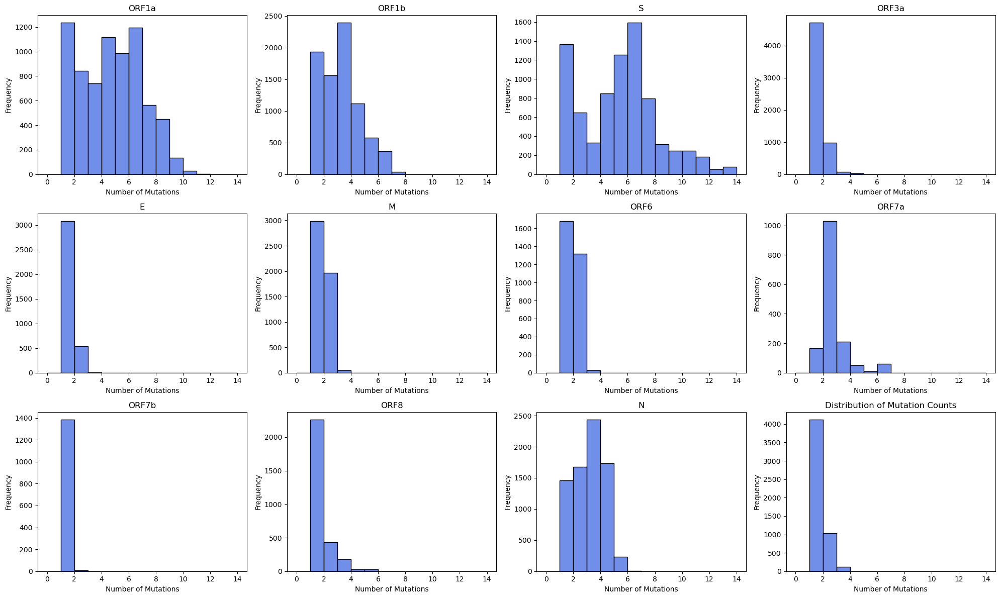

In [5]:
#To verify that the mutational accumulation count is correct, I graphed the frequency of the number of mutations.
#I expect S gene to have many high number of mutations and other genes to have a lower frequncey of high number of mutations. 

# create subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12))
axes = axes.flatten()

# loop through each gene and plot the frequency of mutations
for i, gene in enumerate(genes_of_interest): #enumerate numbers each item in a list
    # get the mutation counts for the gene
    counts = list(mutation_counts_by_gene[gene].values())
    # plot histogram
    sns.histplot(ax=axes[i], data=counts, bins=range(15), color='royalblue')
    axes[i].set_title(gene)
    axes[i].set_xlabel("Number of Mutations")
    axes[i].set_ylabel("Frequency")

# adjust spacing and show plot
# set the title
plt.title("Distribution of Mutation Counts")
fig.tight_layout()
plt.show()

In [15]:
# loop through each tip and count mutations
for node in tree.find_clades(terminal=True): #loops through each terminal node in the tree
    path = tree.get_path(node) #gets path from the root of the tree to the current node
    path_mutations = {} #creates an empty dictionary to store the mutations along path for each gene
    for gene in genes_of_interest:
        path_mutations[gene] = [] # create an empty list for each gene to store the mutations along the path
        
    for i in range(len(path) - 1): #loops through each branch along the path, except for the last one (which leads to the current node)
        mutations = path[i].branch_attrs.get("mutations", []) #gets the mutations along the current branch
        #print(mutations)
        for mutation in mutations:
            for gene in genes_of_interest:
                if mutation.split(":")[0] == gene: #checks if mutation is in current gene of interest
                    path_mutations[gene].append(mutation) #adds the mutation to the list for the current gene
        
    # count mutations for each gene along the path
    for gene in genes_of_interest:
        mutation_count = len(path_mutations[gene]) #count the number of mutations for the current gene along the path
        #print(mutation_count)
        #store mutation count for tip in dictionary
        mutation_counts_by_gene[gene][node.name] = mutation_count


In [5]:
for gene in genes_of_interest:
    for node in tree.find_clades(terminal=True):
        path = tree.get_path(node)
        path_mutations = {}
        for i in range(len(path) - 1):
            for mutation in path[i].branch_attrs.get("mutations", []):
                if mutation.split(":")[0] == gene:
                    if mutation not in path_mutations:
                        path_mutations[mutation] = 1
                    else:
                        path_mutations[mutation] += 1
        print(f"Gene: {gene}, Path Mutations: {path_mutations}")

Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, P

Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations:

Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene: ORF1a, Path Mutations: {}
Gene

Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 1}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 2}
Gene: ORF1a, Path Mutations: {'ORF1a': 3}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF1a': 4}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF1a': 5}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 10}
Gene: ORF1a, Path Mutations: {'ORF1a': 11}
Gene: ORF1a, Path Mutations: {'ORF1a': 11}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 10}
Gene: ORF1a, Path Mutations: {'ORF1a': 10}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: 

Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 10}
Gene: ORF1a, Path Mutations: {'ORF1a': 10}
Gene: ORF1a, Path Mutations: {'ORF1a': 10}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'

Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 8}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF1a': 9}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 6}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF1a': 7}
Gene: ORF1a, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 1}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF1b': 2}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 7}
Gene: ORF1b, Path Mutations: {'ORF1b': 7}
Gene: ORF1b, Path Mutations: {'ORF1b': 7}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF1b': 6}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF1b': 3}
Gene: ORF1b, Path Mutations: {'ORF

Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 5}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF1b': 4}
Gene: ORF1b, Path Mutations: {'ORF

Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 2}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 3}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path Mutations: {'S': 1}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 4}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 5}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 12}
Gene: S, Path Mutations: {'S': 12}
Gene: S, Path Mutations: {'S': 12}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 14}
Gene: S, Path Mutations: {'S': 14}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 14}
Gene: S, Path Mutations: {'S': 14}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutations: {'S': 13}
Gene: S, Path Mutati

Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutation

Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 10}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, P

Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 11}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}

Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path 

Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 8}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 7}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 9}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path Mutations: {'S': 6}
Gene: S, Path 

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: OR

Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 3}
Gene: ORF3a, Path Mutations: {'ORF3a': 3}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mu

Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {}


Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Ge

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3

Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Muta

Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: OR

Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: ORF3a, Path Mutations: {}
Gene: OR

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 3}
Gene: ORF3a, Path Mutations: {'ORF3a': 3}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 2}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF3a': 1}
Gene: ORF3a, Path Mutations: {'ORF

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutati

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutati

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutati

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutati

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E,

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutati

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutati

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutati

Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutations: {}
Gene: E, Path Mutati

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 2}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path Mutations: {'E': 1}
Gene: E, Path 

Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutati

Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M,

Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M':

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M,

Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutati

Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutati

Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutations: {}
Gene: M, Path Mutati

Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path Mutations: {'M': 1}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 3}
Gene: M, Path Mutations: {'M': 3}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path 

Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path Mutations: {'M': 2}
Gene: M, Path 

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gen

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Muta

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutation

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: ORF6, Path Mutations: {}
Gene: OR

Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}


Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}


Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}


Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}


Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}


Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}
Gene: ORF6, Path Mutations: {'ORF6': 1}


Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}


Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}


Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}


Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}


Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}


Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF6, Path Mutations: {'ORF6': 2}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutati

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF

Gene: ORF7a, Path Mutations: {'ORF7a': 4}
Gene: ORF7a, Path Mutations: {'ORF7a': 4}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 5}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF7a': 6}
Gene: ORF7a, Path Mutations: {'ORF

Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF

Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF

Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 3}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF7a': 2}
Gene: ORF7a, Path Mutations: {'ORF

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Muta

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}


Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {'ORF7a': 1}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: ORF7a, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF

Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF

Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF

Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF

Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutati

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mu

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mu

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: OR

Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {'ORF7b': 1}
Gene: ORF7b, Path Mutations: {}
Gene: ORF7

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Muta

Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}


Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}


Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}


Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}


Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}


Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Muta

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, 

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}


Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 2}
Gene: ORF8, Path Mutations: {'ORF8': 4}
Gene: ORF8, Path Mutations: {'ORF8': 4}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 3}
Gene: ORF8, Path Mutations: {'ORF8': 4}
Gene: ORF8, Path Mutations: {'ORF8': 4}
Gene: ORF8, Path Mutations: {'ORF8': 4}


Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}
Gene: ORF8, Path Mutations: {'ORF8': 1}


Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: ORF8, Path Mutations: {}
Gene: OR

Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations:

Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}


Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations:

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 6}
Gene: N, Path Mutations: {'N': 6}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path Mutations: {'N': 1}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path Mutations: {'N': 2}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 5}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path Mutations: {'N': 4}
Gene: N, Path 

Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path Mutations: {'N': 3}
Gene: N, Path 

Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: OR

Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: OR

Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mu

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: OR

Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: OR

Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: OR

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: ORF9b, Path Mutations: {}
Gene: OR

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF9b': 1}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF9b': 3}
Gene: ORF9b, Path Mutations: {'ORF

Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF9b': 2}
Gene: ORF9b, Path Mutations: {'ORF

In [15]:
for node in tree.find_clades(order='preorder'):
    if isinstance(node, Clade):
        mutations = node.branch_attrs['mutations']
        print("Node:", node.name)
        print("Mutations:", mutations)
        print("Branch length:", node.branch_length)

Node: NODE_0000006
Mutations: {}
Branch length: 0.0
Node: hCoV-19/Wuhan/Hu-1/2019
Mutations: {}
Branch length: 0
Node: NODE_0000001
Mutations: {}
Branch length: 0
Node: NODE_0000007
Mutations: {}
Branch length: 0
Node: NODE_0000397
Mutations: {'nuc': ['C15324T', 'C29303T'], 'N': ['P344S']}
Branch length: 2
Node: hCoV-19/UnitedArabEmirates/skmc-003/2020
Mutations: {'nuc': ['C10456T', 'T21644C', 'C23170T'], 'S': ['Y28H']}
Branch length: 3
Node: hCoV-19/Japan/KP1/2020
Mutations: {'nuc': ['G11557T', 'C25810G'], 'ORF1a': ['E3764D'], 'ORF3a': ['L140V']}
Branch length: 2
Node: NODE_0000016
Mutations: {}
Branch length: 0
Node: hCoV-19/Wuhan/HBCDC-HB-01/2019
Mutations: {'nuc': ['T21656A'], 'S': ['F32I']}
Branch length: 1
Node: NODE_0000020
Mutations: {}
Branch length: 0
Node: NODE_0000391
Mutations: {'nuc': ['C3037T']}
Branch length: 1
Node: hCoV-19/India/OR-ILSCV19358/2020
Mutations: {'nuc': ['T3913C', 'T6163C', 'C9559T', 'C10641T', 'C21691T', 'A25381C', 'C26542A'], 'ORF1a': ['T3459M'], 'M': [

In [16]:
for node in tree.find_clades(order='preorder'):
    mutations = node.mutations
    if mutations:
        print("Node:", node.name)
        print("Mutations:", mutations)
    if node.branch_length:
        print("Branch length:", node.branch_length)

AttributeError: 'Clade' object has no attribute 'up'

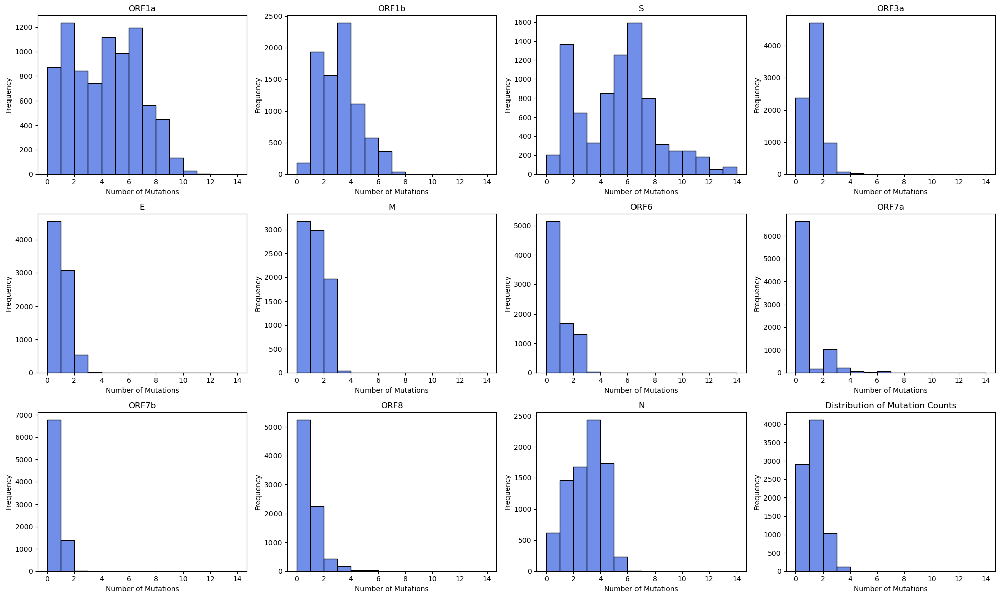

In [9]:
#To verify that the mutational accumulation count is correct, I graphed the frequency of the number of mutations.
#I expect S gene to have many high number of mutations and other genes to have a lower frequncey of high number of mutations. 

# create subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12))
axes = axes.flatten()

# loop through each gene and plot the frequency of mutations
for i, gene in enumerate(genes_of_interest): #enumerate numbers each item in a list
    # get the mutation counts for the gene
    counts = list(mutation_counts_by_gene[gene].values())
    # plot histogram
    sns.histplot(ax=axes[i], data=counts, bins=range(15), color='royalblue')
    axes[i].set_title(gene)
    axes[i].set_xlabel("Number of Mutations")
    axes[i].set_ylabel("Frequency")

# adjust spacing and show plot
# set the title
plt.title("Distribution of Mutation Counts")
fig.tight_layout()
plt.show()

In [4]:
genes_of_interest = ["ORF1a", "ORF1b", "S", "ORF3a", "E", "M", "ORF6", "ORF7a", "ORF7b", "ORF8", "N", "ORF9b"]

count = 0
# create a dictionary for each gene of interest to store mutation counts for each tip
mutation_counts_by_gene = {}
for gene in genes_of_interest:
    mutation_counts_by_gene[gene] = {}

# loop through each tip and count mutations
for node in tree.find_clades(terminal=True): #loops through each terminal node in the tree

    path = tree.get_path(node) #gets path from the root of the tree to the current node
    path_mutations = {} #creates an empty dictionary to store the mutations along path
    count+=1
    for i in range(len(path) - 1): #loops through each branch along the path, except for the last one (which leads to the current node)
        path_mutations.update(path[i].branch_attrs.get("mutations", {})) #adds the mutations along the current branch to dictionary

    for gene in genes_of_interest: #loops through each gene of interest
        gene_mutation_count = 0 #initializes a count of the mutations for the current gene to zero

        for mutation in path_mutations.get(gene, []): # loops through each mutation along the path for the current gene
            gene_mutation_count += 1 #adds 1 to the mutation count for the current gene

        # store mutation count for tip in dictionary
        mutation_counts_by_gene[gene][node.name] = gene_mutation_count
